#Python for data analysis





##Libraries

In [ ]:
import pandas as pd
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
from sklearn import datasets,tree,ensemble,discriminant_analysis, metrics
import seaborn as sns
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
import statsmodels.api as sm
from flask import Flask
from scipy.stats import chi2_contingency 
from plotly.subplots import make_subplots


##Data import

In [ ]:
df=pd.read_csv('https://github.com/Leow92/Python_Data_Analysis/raw/main/diabetic_data.csv')


# Mapping and Treatments for visualization of the data

In [ ]:
df.drop('weight', axis=1, inplace=True)
df.replace('No',0)
df.replace('Yes',1)
df['age'] = df['age'].map(lambda x: x.lstrip('[').rstrip(')'))
df['age'] = df['age'].map({'0-10':5,
                             '10-20':15,
                             '20-30':25,
                             '30-40':35,
                             '40-50':45,
                             '50-60':55,
                             '60-70':65,
                             '70-80':75,
                             '80-90':85,  
                             '90-100':95,                          
                             np.nan:'NY'},
                             na_action=None)

# fusion the data that are similar in the discharge_disposition_id, admission_type_id, admission_type_id
df['discharge_disposition_id'] = df['discharge_disposition_id'].apply(lambda x : 1 if int(x) in [6, 8, 9, 13] 
                                                                           else ( 2 if int(x) in [3, 4, 5, 14, 22, 23, 24]
                                                                           else ( 10 if int(x) in [12, 15, 16, 17]
                                                                           else ( 11 if int(x) in [19, 20, 21]
                                                                           else ( 18 if int(x) in [25, 26] 
                                                                           else int(x) )))))

df = df[~df.discharge_disposition_id.isin([11,13,14,19,20,21])]

df['admission_type_id'] = df['admission_type_id'].apply(lambda x : 1 if int(x) in [2, 7]
                                                            else ( 5 if int(x) in [6, 8]
                                                            else int(x) ))

df['admission_source_id'] = df['admission_source_id'].apply(lambda x : 1 if int(x) in [2, 3]
                                                            else ( 4 if int(x) in [5, 6, 10, 22, 25]
                                                            else ( 9 if int(x) in [15, 17, 20, 21]
                                                            else ( 11 if int(x) in [13, 14]
                                                            else int(x) ))))

admission_type={
    1:"Emergency",
    2:"Urgent",
    3:"Elective",
    4:"Newborn",
    5:"Not availbale",
    6:"Null",
    7:"Trauma Center",
    8:"Not mapped",
}
df["admission_type"] =np.where(df['admission_type_id']==1, "Emergency", "temp")

discharge_disposition={
    1:"Discharged to home",
    2:"Discharged/transferred to another short term hospital",
    3:"Discharged/transferred to SNF",
    4:"Discharged/transferred to ICF",
    5:"Discharged/transferred to another type of inpatient care institution",
    6:"Discharged/transferred to home with home health service",
    7:"Left AMA",
    8:"Discharged/transferred to home under care of Home IV provider",
    9:"Admitted as an inpatient to this hospital",
    10:"Neonate discharged to another hospital for neonatal aftercare",
    11:"Expired",
    12:"Still patient or expected to return for outpatient services",
    13:"Hospice / home",
    14:"Hospice / medical facility",
    15:"Discharged/transferred within this institution to Medicare approved swing bed",
    16:"Discharged/transferred/referred another institution for outpatient services",
    17:"Discharged/transferred/referred to this institution for outpatient services",
    18:"NULL",
    19:"Expired at home. Medicaid only, hospice.",
    20:"Expired in a medical facility. Medicaid only, hospice.",
    21:"Expired, place unknown. Medicaid only, hospice.",
    22:"Discharged/transferred to another rehab fac including rehab units of a hospital .",
    23:"Discharged/transferred to a long term care hospital.",
    24:"Discharged/transferred to a nursing facility certified under Medicaid but not certified under Medicare.",
    25:"Not Mapped",
    26:"Unknown/Invalid",
    30:"Discharged/transferred to another Type of Health Care Institution not Defined Elsewhere",
    27:"Discharged/transferred to a federal health care facility.",
    28:"Discharged/transferred/referred to a psychiatric hospital of psychiatric distinct part unit of a hospital",
    29:"Discharged/transferred to a Critical Access Hospital (CAH).",
}

admission_source={
    1: "Physician Referral",
    2:"Clinic Referral",
    3:"HMO Referral",
    4:"Transfer from a hospital",
    5:"Transfer from a Skilled Nursing Facility (SNF)",
    6:"Transfer from another health care facility",
    7:"Emergency Room",
    8:"Court/Law Enforcement",
    9:"Not Available",
    10:"Transfer from critial access hospital",
    11:"Normal Delivery",
    12:"Premature Delivery",
    13:"Sick Baby",
    14:"Extramural Birth",
    15:"Not Available",
    17:"NULL",
    18:"Transfer From Another Home Health Agency",
    19:"Readmission to Same Home Health Agency",
    20:"Not Mapped",
    21:"Unknown/Invalid",
    22:"Transfer from hospital inpt/same fac reslt in a sep claim",
    23:"Born inside this \'hospital",
    24:"Born outside this hospital",
    25:"Transfer from Ambulatory Surgery Center",
    26:"Transfer from Hospice",
}


df["admission_source"]=df.admission_source_id.map(admission_source)
df["discharge_disposition"] = df.discharge_disposition_id.map(discharge_disposition)
df["admission_type"] = df.admission_type_id.map(admission_type)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:28: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



General information on the dataset

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 101766 entries, 0 to 101765
Data columns (total 53 columns):
 #   Column                    Non-Null Count   Dtype 
---  ------                    --------------   ----- 
 0   encounter_id              101766 non-null  int64 
 1   patient_nbr               101766 non-null  int64 
 2   race                      101766 non-null  object
 3   gender                    101766 non-null  object
 4   age                       101766 non-null  object
 5   weight                    101766 non-null  object
 6   admission_type_id         101766 non-null  int64 
 7   discharge_disposition_id  101766 non-null  int64 
 8   admission_source_id       101766 non-null  int64 
 9   time_in_hospital          101766 non-null  int64 
 10  payer_code                101766 non-null  object
 11  medical_specialty         101766 non-null  object
 12  num_lab_procedures        101766 non-null  int64 
 13  num_procedures            101766 non-null  int64 
 14  num_

In [ ]:
df.head()

,encounter_id,patient_nbr,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,medical_specialty,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,diag_1,diag_2,diag_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted,admission_source,discharge_dispostion,admission_type
0,2278392,8222157,Caucasian,Female,[0-10),?,6,25,1,1,?,Pediatrics-Endocrinology,41,0,1,0,0,0,250.83,?,?,1,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,NO,Physician Referral,Not Mapped,Null
1,149190,55629189,Caucasian,Female,[10-20),?,1,1,7,3,?,?,59,0,18,0,0,0,276,250.01,255,9,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Up,No,No,No,No,No,Ch,Yes,>30,Emergency Room,Discharged to home,Emergency
2,64410,86047875,AfricanAmerican,Female,[20-30),?,1,1,7,2,?,?,11,5,13,2,0,1,648,250,V27,6,None,None,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Yes,NO,Emergency Room,Discharged to home,Emergency
3,500364,82442376,Caucasian,Male,[30-40),?,1,1,7,2,?,?,44,1,16,0,0,0,8,250.43,403,7,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Up,No,No,No,No,No,Ch,Yes,NO,Emergency Room,Discharged to home,Emergency
4,16680,42519267,Caucasian,Male,[40-50),?,1,1,7,1,?,?,51,0,8,0,0,0,197,157,250,5,None,None,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,Ch,Yes,NO,Emergency Room,Discharged to home,Emergency


#Vizualizations


### People readmitted or not

In [ ]:
df2=df.copy()
df2["readmitted"]=df2["readmitted"].replace("NO","not readmitted")
df2["readmitted"]=df2["readmitted"].replace(">30","readmitted")
df2["readmitted"]=df2["readmitted"].replace("<30","readmitted")
df2["data"]=df["insulin"].apply(lambda x: 1)
df2=df2[(df2["gender"]=="Female") | (df2["gender"]=="Male")]
fig=px.histogram(df2, y="data", x="readmitted",barmode='group')
fig.show()


The proportion of people not readmitted is higher

### Time in hospital depending of the category and if the person has been readmitted or not

In [ ]:
px.histogram(df2,x=df2["age"],y=df2['time_in_hospital'], color=df2["readmitted"], marginal="box")

We can observe that readmitted people between 70 and 80 years old are the people who spends the most time in the hospital

### People readmitted or not depending of the sexe of the people

In [ ]:
df2=df.copy()
df2["readmitted"]=df2["readmitted"].replace("NO","not readmitted")
df2["readmitted"]=df2["readmitted"].replace(">30","readmitted")
df2["readmitted"]=df2["readmitted"].replace("<30","readmitted")
df2["temp"]=df["insulin"].apply(lambda x: 1)
df2=df2[(df2["gender"]=="Female") | (df2["gender"]=="Male")]
fig=px.histogram(df2, y="temp", x="readmitted",color='gender',barmode='group')
fig.show()


We can observe that in our patients the proportion of female patients is higher than the proportion of male patients

### People readmitted or not depending on the insulin intake

In [ ]:
px.box(df2,x=df2["readmitted"],y=df2['insulin'])

In this vizualisation, we can observe that the average rate of insulin of the people readmitted is up. 
Generally we can say that the people with diabetes have an upper average rate of insulin in the blood.

### People readmitted or not depending on the number of medications taken

In [ ]:
px.histogram(df2,x=df2["readmitted"],y=df2['num_medications'])

We can see that the number of medications is higher for the people who were not readmitted than for the people who got readmitted to the hospital.

### People readmitted or not depending on the intake of diabetes med

In [ ]:
px.box(df2,x=df2["readmitted"],y=df2['diabetesMed'])

We can observe that all the readmitted people were already taking diabetes medications

### Number of laboratory procedures depending on the age and the readmission

In [ ]:
px.histogram(df2,x=df2["age"],y=df2['num_lab_procedures'], color=df2["readmitted"], marginal="box")

We can observe that readmitted people between 70 and 80 years old are the people who have the highest number of lab procedures in the hospital

### Admission type if readmitted or not

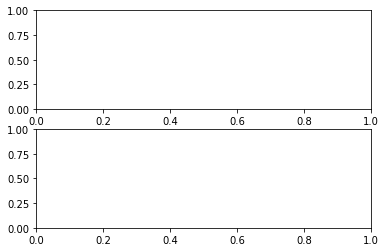

In [ ]:
fig ,ax = plt.subplots(2,1)
plot_df=df
plot_df["readmitted"]=plot_df["readmitted"].replace("not readmitted",0)
plot_df["readmitted"]=plot_df["readmitted"].replace("NO",0)
plot_df["readmitted"]=plot_df["readmitted"].replace("readmitted",1)
plot_df["readmitted"]=plot_df["readmitted"].replace(">30",1)
plot_df["readmitted"]=plot_df["readmitted"].replace("<30",1)

plot_df=plot_df[plot_df["readmitted"]==0]
ax[1]=px.pie(plot_df, values='admission_type_id', names='admission_type', title='Admission type if never readmitted')


plot_df=df
plot_df["readmitted"]=plot_df["readmitted"].replace("not readmitted",0)
plot_df["readmitted"]=plot_df["readmitted"].replace("NO",0)
plot_df["readmitted"]=plot_df["readmitted"].replace("readmitted",1)
plot_df["readmitted"]=plot_df["readmitted"].replace(">30",1)
plot_df["readmitted"]=plot_df["readmitted"].replace("<30",1)

plot_df=plot_df[plot_df["readmitted"]==1]
ax[0]=px.pie(plot_df, values='admission_type_id', names='admission_type', title='Admission type if readmitted')

ax[0].show()
ax[1].show()




The most common type of admissionin the readmitted people is the Emergency admission

### Disposition type if readmitted or not

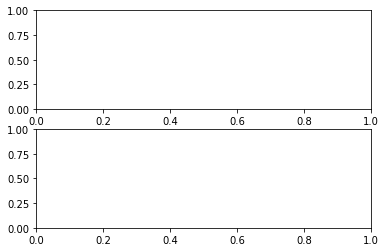

In [ ]:
fig ,ax = plt.subplots(2,1)
plot_df=df
plot_df["readmitted"]=plot_df["readmitted"].replace("not readmitted",0)
plot_df["readmitted"]=plot_df["readmitted"].replace("NO",0)
plot_df["readmitted"]=plot_df["readmitted"].replace("readmitted",1)
plot_df["readmitted"]=plot_df["readmitted"].replace(">30",1)
plot_df["readmitted"]=plot_df["readmitted"].replace("<30",1)

plot_df=plot_df[plot_df["readmitted"]==0]
ax[1]=px.pie(plot_df, values='discharge_disposition_id', names='discharge_disposition', title='Discharge disposition if never readmitted')


plot_df=df
plot_df["readmitted"]=plot_df["readmitted"].replace("not readmitted",0)
plot_df["readmitted"]=plot_df["readmitted"].replace("NO",0)
plot_df["readmitted"]=plot_df["readmitted"].replace("readmitted",1)
plot_df["readmitted"]=plot_df["readmitted"].replace(">30",1)
plot_df["readmitted"]=plot_df["readmitted"].replace("<30",1)

plot_df=plot_df[plot_df["readmitted"]==1]
ax[0]=px.pie(plot_df, values='discharge_disposition_id', names='discharge_disposition', title='Discharge disposition  if readmitted')
ax[0].show()
ax[1].show()


The most common types of Discharge Dispositions are : Discharged/Transferred to home with home health service and Discharged to home

#Prediction of the rehospitalisation of patient (machine learning)

Import and treatments of the data for machine learning

In [ ]:
df=pd.read_csv('https://github.com/Leow92/Python_Data_Analysis/raw/main/diabetic_data.csv')

df.replace('No',0)
df.replace('Yes',1)

# mean of the age categorie
replaceDict = {'[0-10)' : 5,
'[10-20)' : 15,
'[20-30)' : 25, 
'[30-40)' : 35, 
'[40-50)' : 45, 
'[50-60)' : 55,
'[60-70)' : 65, 
'[70-80)' : 75,
'[80-90)' : 85,
'[90-100)' : 95}
df['age'] =df['age'].apply(lambda x : replaceDict[x])

# modification to readmitted
df["readmitted"]=df["readmitted"].replace("NO",0)
df["readmitted"]=df["readmitted"].replace(">30",1)
df["readmitted"]=df["readmitted"].replace("<30",1)

# drop duplicates to avoid having the same patient affecting the data
df.drop_duplicates(['patient_nbr'], keep = 'first', inplace = True)

# fusion the data that are similar in the discharge_disposition_id, admission_type_id, admission_type_id
df['discharge_disposition_id'] = df['discharge_disposition_id'].apply(lambda x : 1 if int(x) in [6, 8, 9, 13] 
                                                                           else ( 2 if int(x) in [3, 4, 5, 14, 22, 23, 24]
                                                                           else ( 10 if int(x) in [12, 15, 16, 17]
                                                                           else ( 11 if int(x) in [19, 20, 21]
                                                                           else ( 18 if int(x) in [25, 26] 
                                                                           else int(x) )))))

df = df[~df.discharge_disposition_id.isin([11,13,14,19,20,21])]

df['admission_type_id'] = df['admission_type_id'].apply(lambda x : 1 if int(x) in [2, 7]
                                                            else ( 5 if int(x) in [6, 8]
                                                            else int(x) ))

df['admission_source_id'] = df['admission_source_id'].apply(lambda x : 1 if int(x) in [2, 3]
                                                            else ( 4 if int(x) in [5, 6, 10, 22, 25]
                                                            else ( 9 if int(x) in [15, 17, 20, 21]
                                                            else ( 11 if int(x) in [13, 14]
                                                            else int(x) ))))

# transformation to get values instead of categorical type
for col in ["metformin", "repaglinide", "nateglinide", "chlorpropamide", "glimepiride", "acetohexamide", "glipizide", "glyburide", "tolbutamide", "pioglitazone", "rosiglitazone", "acarbose", "miglitol", "troglitazone", "tolazamide", "examide", "citoglipton", "insulin", "glyburide-metformin", "glipizide-metformin", "glimepiride-pioglitazone", "metformin-rosiglitazone", "metformin-pioglitazone"]:
    df[col] = df[col].apply(lambda x : 1 if x == 'Up' 
                                              else ( -1 if x == 'Down'                                                          
                                              else ( 0 if x == 'Steady'
                                              else  -2)))


df['change'] = df['change'].apply(lambda x : 1 if x == 'Ch'
                                                 else -1)


df['diabetesMed'] = df['diabetesMed'].apply(lambda x : -1 if x == 'No'
                                                else 1)


df['max_glu_serum'] = df['max_glu_serum'].apply(lambda x : 2 if x == '>200' 
                                                            else ( 3 if x == '>300'                                                          
                                                            else ( 1 if x == 'Norm'
                                                            else  0)))

df['A1Cresult'] = df['A1Cresult'].apply(lambda x : 7 if x == '>7' 
                                                         else (8 if  x == '>8'                                                        
                                                         else ( 5 if x == 'Norm'

                                                               else  0)))

df['gender'] = df['gender'].apply(lambda x : 1 if x == 'Male'
                                                 else -1)


# useless because diagnotics are categorical. There are hundereds of different diagnostics. Moreover a lot of data is missig
df.drop('diag_1', axis=1, inplace=True)
df.drop('diag_2', axis=1, inplace=True)
df.drop('diag_3', axis=1, inplace=True)



# creation of a severity of disease variable
df["severity_of_disease"]=(df["time_in_hospital"]+df["num_procedures"]+df["num_medications"]+df["num_lab_procedures"]+df["number_diagnoses"])^2


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:41: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Get percentage of missing values of the dataset


In [ ]:
df.replace(r"?", np.nan, inplace=True)
df_missing_values=df.isna()
df_missing_values.head()
temp=df_missing_values.sum() / len(df)
temp=temp.sort_values(ascending=False)
temp.head(8)

weight               0.960048
medical_specialty    0.481827
payer_code           0.433768
race                 0.027274
num_procedures       0.000000
metformin            0.000000
A1Cresult            0.000000
max_glu_serum        0.000000
dtype: float64

Drop columns that have too much unknown values or are not related to the health of a patient

In [ ]:

df.drop('weight', axis=1, inplace=True)
df.drop('encounter_id', axis=1, inplace=True)
df.drop('patient_nbr', axis=1, inplace=True)
df.drop('payer_code', axis=1, inplace=True)
df.drop('medical_specialty', axis=1, inplace=True)

Get most frequent value for each columns

In [ ]:

dfs = []
for col in df.columns:
    top_values = []
    top_values = df[col].mode()
    dfs.append(pd.DataFrame({col: top_values}).reset_index(drop=True))
pd.concat(dfs, axis=1)


,race,gender,age,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted,severity_of_disease
0,Caucasian,-1.0,75.0,1.0,1.0,7.0,3.0,1.0,0.0,13.0,0.0,0.0,0.0,9.0,0.0,0.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-1.0,1.0,0.0,68
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,69


Replace unrknown data by most frequent value because less than one percent of the data is missing

In [ ]:
df['race'].fillna("Caucasian",inplace=True)

Encoding categorical data

In [ ]:
df=pd.get_dummies(data=df,columns=["race"])

Chi square test to determine significant and not significant variables

In [ ]:

categorical_features=df.columns.values
for col in categorical_features : 
    data_crosstab = pd.crosstab(df['readmitted'],  
                                df[col], 
                                margins = False) 

    stat, p, dof, expected = chi2_contingency(data_crosstab)
    if p < 0.05 :
	      print(p, col, 'is significant')
    else:
        print(p, col, 'is not significant')


1.2592581867624394e-05 gender is significant
3.490547447114666e-101 age is significant
5.538057114648416e-64 admission_type_id is significant
7.009338382177868e-32 discharge_disposition_id is significant
4.531184390154617e-108 admission_source_id is significant
5.639119192447557e-64 time_in_hospital is significant
2.763628885639511e-32 num_lab_procedures is significant
7.96656687075254e-13 num_procedures is significant
9.613780393301148e-75 num_medications is significant
1.7505780937657925e-96 number_outpatient is significant
9.608373206715417e-123 number_emergency is significant
0.0 number_inpatient is significant
7.612450625452629e-182 number_diagnoses is significant
1.004060059897826e-07 max_glu_serum is significant
1.3102294261121666e-08 A1Cresult is significant
6.948208166453658e-08 metformin is significant
5.371993602219062e-07 repaglinide is significant
0.4570723096775884 nateglinide is not significant
0.4307992087447152 chlorpropamide is not significant
0.4076753710624704 glime

Drop not significant variables


In [ ]:

df.drop('max_glu_serum', axis=1, inplace=True)
df.drop('nateglinide', axis=1, inplace=True)
df.drop('chlorpropamide', axis=1, inplace=True)
df.drop('glyburide-metformin', axis=1, inplace=True)
df.drop('discharge_disposition_id', axis=1, inplace=True)
df.drop('acetohexamide', axis=1, inplace=True)
df.drop('glipizide', axis=1, inplace=True)
df.drop('tolbutamide', axis=1, inplace=True)
df.drop('examide', axis=1, inplace=True)
df.drop('citoglipton', axis=1, inplace=True)
df.drop('race_Hispanic', axis=1, inplace=True)
df.drop('race_Other', axis=1, inplace=True)
df.drop('metformin-pioglitazone', axis=1, inplace=True)
df.drop('glimepiride-pioglitazone', axis=1, inplace=True)
df.drop('tolazamide', axis=1, inplace=True)
df.drop('troglitazone', axis=1, inplace=True)
df.drop('pioglitazone', axis=1, inplace=True)
df.drop('glyburide', axis=1, inplace=True)


Separation of the dataset in two new datasets


In [ ]:
df_y=df["readmitted"]
df.drop('readmitted', axis=1, inplace=True)
df_x=df
x_train, x_test, y_train, y_test = train_test_split(df_x, df_y,test_size=0.25)

Fitting of the data

In [ ]:
scaler=StandardScaler()
scaler.fit(x_train)   # only fitting the training data

x_train=scaler.transform(x_train)
x_test=scaler.transform(x_test)

## Logistic regression

### fitting and test of the model with standard hyperparameter

In [ ]:
model = LogisticRegression(solver='liblinear', random_state=0)
model.fit(x_train, y_train)
model.score(x_test, y_test)

0.6204213754330172

### crossvalidation to see the variation and efficacity of the model

In [ ]:
cross_val_score(model,x_train,y_train,n_jobs=-1)

array([0.62125341, 0.61773985, 0.62333286, 0.61946078, 0.61756902])

### improvment of the model with the hyperparameters

In [ ]:
model = LogisticRegression(solver='liblinear', random_state=0)
parameters={"C":[0.8,1.1,1.5,2.5,3],"tol":[0.000001,.00001,0.0001],"max_iter":[50,100,200,300]}
grid=GridSearchCV(model,parameters,n_jobs=-1,cv=5)
grid.fit(x_train,y_train)
print(grid.best_score_,grid.best_estimator_)

###final test and validation with the best hyperparameters

In [ ]:
model = LogisticRegression(solver='liblinear', random_state=0,C=0.8,tol=1e-6,max_iter=200)
model.fit(x_train, y_train)
model.score(x_test, y_test)

0.6141843971631206

### display of the roc

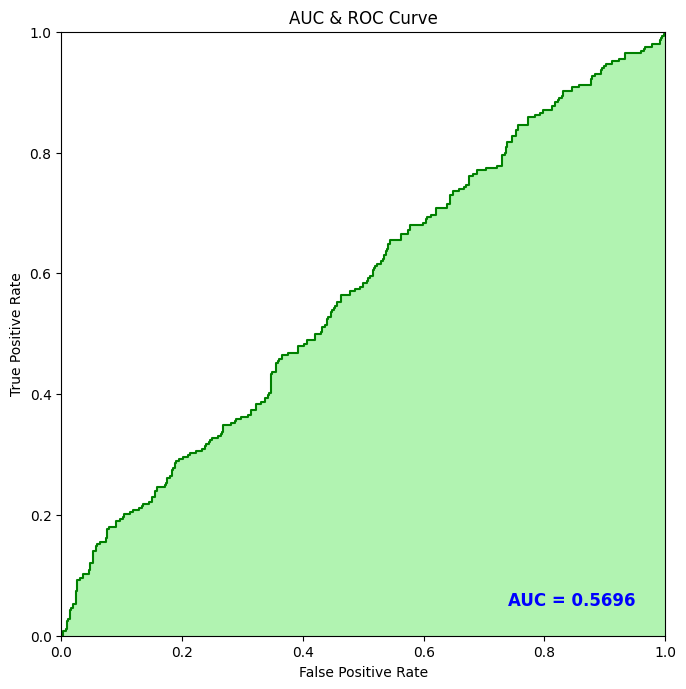

In [ ]:
y_pred =model.predict_proba(x_test)[:,1]

auc = metrics.roc_auc_score(y_test, y_pred)

false_positive_rate, true_positive_rate, thresolds = metrics.roc_curve(y_test, y_pred)

plt.figure(figsize=(10, 8), dpi=100)
plt.axis('scaled')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.title("AUC & ROC Curve")
plt.plot(false_positive_rate, true_positive_rate, 'g')
plt.fill_between(false_positive_rate, true_positive_rate, facecolor='lightgreen', alpha=0.7)
plt.text(0.95, 0.05, 'AUC = %0.4f' % auc, ha='right', fontsize=12, weight='bold', color='blue')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.show()

## Discriminant analysis


### fitting and test of the model with standard hyperparameter

In [ ]:
discAnalysis=discriminant_analysis.LinearDiscriminantAnalysis()
discAnalysis.fit(x_train,y_train)
discAnalysis.score(x_test,y_test)

0.6141843971631206

### crossvalidation to see the variation and efficacity of the model

In [ ]:
cross_val_score(discAnalysis,x_train,y_train,n_jobs=-1)

array([0.61623405, 0.6156604 , 0.61881543, 0.62175534, 0.62266045])

### improvement of the model with the hyperparameters

In [ ]:
model = discriminant_analysis.LinearDiscriminantAnalysis()
parameters={"solver":["svd", "lsqr", "eigen"],"shrinkage":[0,0.1,0.5,1],"tol":[1e-5,1e-4,1e-3]}
grid=GridSearchCV(model,parameters,n_jobs=-1,cv=5)
grid.fit(x_train,y_train)
print(grid.best_score_,grid.best_estimator_)

KeyboardInterrupt: ignored

###final test and validation with the best hyperparameters

In [ ]:
model = discriminant_analysis.LinearDiscriminantAnalysis(shrinkage=0, solver='lsqr', tol=1e-05)
model.fit(x_train, y_train)
model.score(x_test, y_test)

0.6141843971631206

### display of the roc

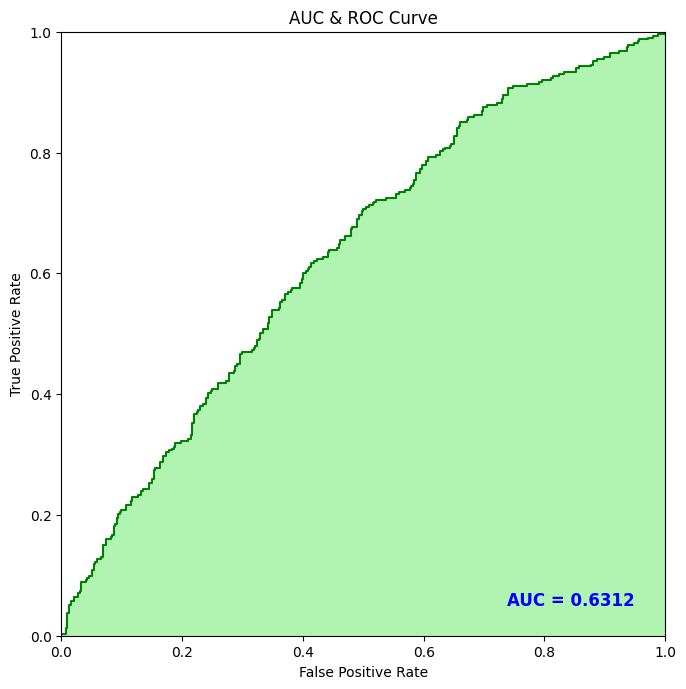

In [ ]:
y_pred =model.predict_proba(x_test)[:,1]

auc = metrics.roc_auc_score(y_test, y_pred)

false_positive_rate, true_positive_rate, thresolds = metrics.roc_curve(y_test, y_pred)

plt.figure(figsize=(10, 8), dpi=100)
plt.axis('scaled')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.title("AUC & ROC Curve")
plt.plot(false_positive_rate, true_positive_rate, 'g')
plt.fill_between(false_positive_rate, true_positive_rate, facecolor='lightgreen', alpha=0.7)
plt.text(0.95, 0.05, 'AUC = %0.4f' % auc, ha='right', fontsize=12, weight='bold', color='blue')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.show()

## decision tree model

### fitting and test of the model with standard hyperparameter

In [ ]:
trees=tree.DecisionTreeClassifier()
trees.fit(x_train,y_train)
trees.score(x_test,y_test)

0.5404255319148936

### crossvalidation to see the variation and efficacity of the model

In [ ]:
cross_val_score(trees,x_train,y_train,n_jobs=-1)

array([1., 1., 1., 1., 1.])

### improvement of the model with the hyperparameters

In [ ]:
model = tree.DecisionTreeClassifier()
parameters={"splitter":["best", "random"],"max_depth":[3,5,7,9,11,-1],"min_samples_split":[2,3,4],"min_samples_leaf":[1,2,3]}
grid=GridSearchCV(model,parameters,n_jobs=-1,cv=5)
grid.fit(x_train,y_train)
print(grid.best_score_,grid.best_estimator_)

1.0 DecisionTreeClassifier(max_depth=3)


/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_validation.py:372: FitFailedWarning:


90 fits failed out of a total of 540.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
90 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_validation.py", line 681, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.7/dist-packages/sklearn/tree/_classes.py", line 942, in fit
    X_idx_sorted=X_idx_sorted,
  File "/usr/local/lib/python3.7/dist-packages/sklearn/tree/_classes.py", line 306, in fit
    raise ValueError("max_depth must be greater than zero. ")
ValueError: max_depth must be greater tha

###final test and validation with the best hyperparameters

In [ ]:
trees=tree.DecisionTreeClassifier(max_depth=7, min_samples_split=3)
trees.fit(x_train,y_train)
trees.score(x_test,y_test)

0.6184397163120567

### display of the roc

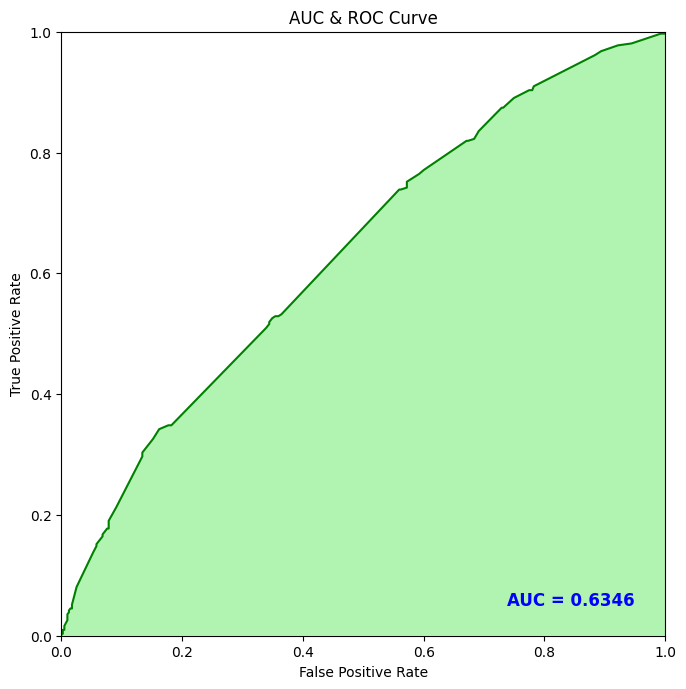

In [ ]:
y_pred =trees.predict_proba(x_test)[:,1]

auc = metrics.roc_auc_score(y_test, y_pred)

false_positive_rate, true_positive_rate, thresolds = metrics.roc_curve(y_test, y_pred)

plt.figure(figsize=(10, 8), dpi=100)
plt.axis('scaled')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.title("AUC & ROC Curve")
plt.plot(false_positive_rate, true_positive_rate, 'g')
plt.fill_between(false_positive_rate, true_positive_rate, facecolor='lightgreen', alpha=0.7)
plt.text(0.95, 0.05, 'AUC = %0.4f' % auc, ha='right', fontsize=12, weight='bold', color='blue')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.show()

## Random forest

### fitting and test of the model with standard hyperparameter

In [ ]:
randomForest=ensemble.RandomForestClassifier()
randomForest.fit(x_train,y_train)
randomForest.score(x_test,y_test)

### crossvalidation to see the variation and efficacity of the model

In [ ]:
cross_val_score(randomForest,x_train,y_train,n_jobs=-1)

### improvement of the model with the hyperparameters

In [ ]:
model = ensemble.RandomForestClassifier()
parameters={"n_estimators":[100,200,300,400],"max_depth":[3,5,7,9,11,-1],"min_samples_split":[2,3,4],"min_samples_leaf":[1,2,3]}
grid=GridSearchCV(model,parameters,n_jobs=-1,cv=5)
grid.fit(x_train,y_train)
print(grid.best_score_,grid.best_estimator_)

###final test and validation with the best hyperparameters

In [ ]:
randomForest=ensemble.RandomForestClassifier(n_estimators=400,max_depth=7,min_samples_split=2,min_samples_leaf=1)
randomForest.fit(x_train,y_train)
randomForest.score(x_test,y_test)

0.5957446808510638

### display of the roc

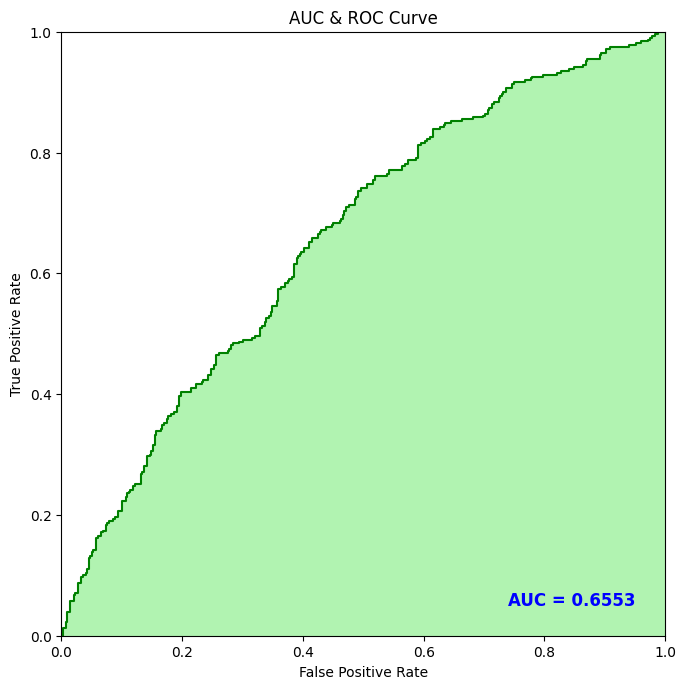

In [ ]:
y_pred =randomForest.predict_proba(x_test)[:,1]

auc = metrics.roc_auc_score(y_test, y_pred)

false_positive_rate, true_positive_rate, thresolds = metrics.roc_curve(y_test, y_pred)

plt.figure(figsize=(10, 8), dpi=100)
plt.axis('scaled')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.title("AUC & ROC Curve")
plt.plot(false_positive_rate, true_positive_rate, 'g')
plt.fill_between(false_positive_rate, true_positive_rate, facecolor='lightgreen', alpha=0.7)
plt.text(0.95, 0.05, 'AUC = %0.4f' % auc, ha='right', fontsize=12, weight='bold', color='blue')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.show()

##Boosting

### fitting and test of the model with standard hyperparameter

In [ ]:
boosting=ensemble.GradientBoostingClassifier()
boosting.fit(x_train,y_train)
boosting.score(x_test,y_test)


0.6056737588652482

### crossvalidation to see the variation and efficacity of the model

In [ ]:
cross_val_score(boosting,x_train,y_train,n_jobs=-1)

### improvement of the model with the hyperparameters

In [ ]:
boosting = ensemble.GradientBoostingClassifier()
parameters={"learning_rate":[0.01,0.1,0.001],"n_estimators":[100,300,500,1000],"min_samples_split":[2,3,4],"min_samples_leaf":[1,2,3]}
grid=GridSearchCV(boosting,parameters,n_jobs=-1,cv=5)
grid.fit(x_train,y_train)
print(grid.best_score_,grid.best_estimator_)

KeyboardInterrupt: ignored

###final test and validation with the best hyperparameters

In [ ]:
boosting=ensemble.GradientBoostingClassifier(learning_rate=0.1,n_estimators=500,min_samples_split=2,min_samples_leaf=1)
boosting.fit(x_train,y_train)
boosting.score(x_test,y_test)

### display of the roc

In [ ]:
y_pred = boosting.predict_proba(x_test)[:,1]
auc = metrics.roc_auc_score(y_test, y_pred)
false_positive_rate, true_positive_rate, thresolds = metrics.roc_curve(y_test, y_pred)
plt.figure(figsize=(10, 8), dpi=100)
plt.axis('scaled')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.title("AUC & ROC Curve")
plt.plot(false_positive_rate, true_positive_rate, 'g')
plt.fill_between(false_positive_rate, true_positive_rate, facecolor='lightgreen', alpha=0.7)
plt.text(0.95, 0.05, 'AUC = %0.4f' % auc, ha='right', fontsize=12, weight='bold', color='blue')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.show()


## Comparison between the models

In [ ]:
# discrimant analysis
model = discriminant_analysis.LinearDiscriminantAnalysis(shrinkage=0, solver='lsqr', tol=1e-05)
model.fit(x_train, y_train)
da=model.score(x_test, y_test)

# logistic regression
model = LogisticRegression(solver='liblinear', random_state=0,C=0.8,tol=1e-6,max_iter=200)
model.fit(x_train, y_train)
lr=model.score(x_test, y_test)


#decision tree
trees=tree.DecisionTreeClassifier(max_depth=7, min_samples_split=3)
trees.fit(x_train,y_train)
tr=trees.score(x_test,y_test)

# random forest
randomForest=ensemble.RandomForestClassifier(n_estimators=400,max_depth=7,min_samples_split=2,min_samples_leaf=1)
randomForest.fit(x_train,y_train)
fo=randomForest.score(x_test,y_test)

# boosting
boosting=ensemble.GradientBoostingClassifier(learning_rate=0.1,n_estimators=1000,min_samples_split=2,min_samples_leaf=1)
boosting.fit(x_train,y_train)
bo=boosting.score(x_test,y_test)

dic={"count":[da,lr,tr,fo,bo],"models":["discrimiant analysis", "logistic regression", "decision tree", "random forest","boosting"]}
final=pd.DataFrame(dic)



fig = px.bar(final,x="models", y="count")
fig.show()

The best model is the boosting model with nearly 63% of good answer